In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sbn
import numpy as np
from IPython.display import IFrame
import shapefile as shp
import plotly.graph_objects as go
import os
import folium
from folium.plugins import MarkerCluster
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)

# Carga de datos

In [2]:
mapa2=shp.Reader("alcaldias.shp")
data=pd.read_csv("escuelas-privadas.csv")
data.head(5)

,id,nivel,nombre,turno,domicilio,colonia,alcaldia,sostenimiento,ubicacion,lat,lon,coordenadas
0,0,INICIAL,CENDI PART SEDI LOMAS,MATUTINO,EXPLANADA NO. 305,LOMAS DE CHAPULTEPEC,MIGUEL HIDALGO,Particular,"EXPLANADA NO. 305, LOMAS DE CHAPULTEPEC, MIGUE...",19.425154,-99.211154,"19.4251542,-99.211154"
1,1,INICIAL,ARMONIA INFANTIL,MATUTINO,AV. SINATEL No 38 MZ. 4 LT. 21,SINATEL AMPLIACION,IZTAPALAPA,Particular,"AV. SINATEL No 38 MZ. 4 LT. 21, SINATEL AMPLIA...",19.364828,-99.131801,"19.3648281,-99.1318013"
2,2,INICIAL,CENDI PART. COLEGIO DE LAS BALEARES,TIEMPO COMPLETO,JOSEFA ORTIZ DE DOMINGUEZ NO 2,TIZAPAN,ALVARO OBREGON,Particular,"JOSEFA ORTIZ DE DOMINGUEZ NO 2, TIZAPAN, ALVAR...",19.335167,-99.202637,"19.3351668,-99.202637"
3,3,INICIAL,"CENDI PART COLEGIO CIBELES, S.C.",MATUTINO,RIO GRIJALVA NUM 27,CUAUHTEMOC,CUAUHTEMOC,Particular,"RIO GRIJALVA NUM 27, CUAUHTEMOC, CUAUHTEMOC",19.433640,-99.170147,"19.4336398,-99.1701471"
4,4,INICIAL,CENTRO DE DESARROLLO INFANTIL KINDERGARDEN,TIEMPO COMPLETO,CALLE 11 DE ENERO DE 1861 NO. 2114,LEYES DE REFORMA,IZTAPALAPA,Particular,"CALLE 11 DE ENERO DE 1861 NO. 2114, LEYES DE R...",19.382635,-99.066102,"19.3826355,-99.0661015"


In [3]:
len(data)

3696

In [4]:
data.alcaldia.value_counts()

IZTAPALAPA                636
GUSTAVO A. MADERO         473
TLALPAN                   325
ALVARO OBREGON            321
BENITO JUAREZ             294
COYOACAN                  290
MIGUEL HIDALGO            223
CUAUHTEMOC                190
CUAJIMALPA DE MORELOS     172
XOCHIMILCO                149
VENUSTIANO CARRANZA       140
IZTACALCO                 138
AZCAPOTZALCO              126
TLAHUAC                   103
LA MAGDALENA CONTRERAS     84
MILPA ALTA                 32
Name: alcaldia, dtype: int64

In [5]:
dalcaldias=data[["domicilio","alcaldia"]]

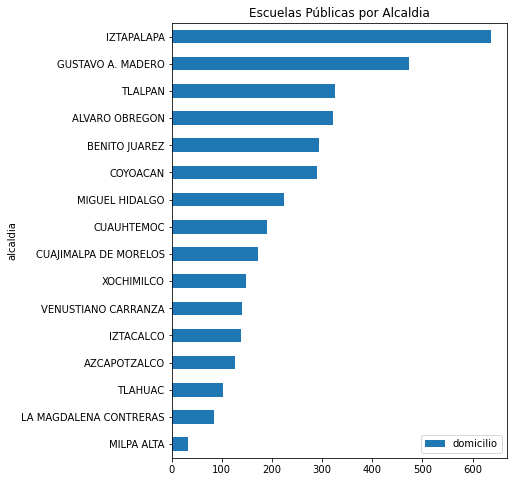

In [6]:
dalcaldias.groupby("alcaldia").count().nsmallest(20,"domicilio").plot(kind="barh", figsize=(6,8))
plt.title("Escuelas Públicas por Alcaldia")
plt.show()

In [7]:
def read_shapefile(sf):
    """
    Read a shapefile into a Pandas dataframe with a 'coords' 
    column holding the geometry information. This uses the pyshp
    package
    """
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    return df

In [8]:
def plot_map(sf, figsize = (20,20)):
    '''
    Plot map with lim coordinates
    '''
    plt.figure(figsize = figsize)
    id=0
    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, 'k')

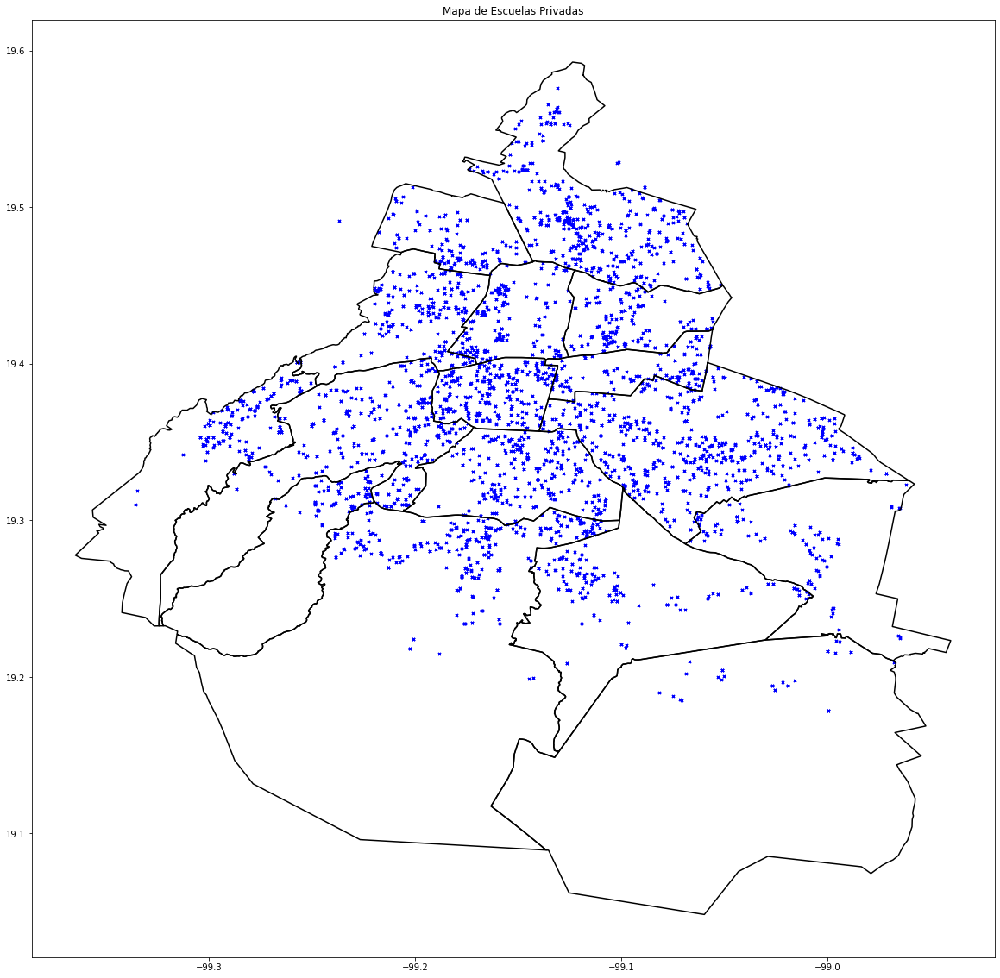

In [9]:
plot_map(mapa2)
escuelas=data["lon"],data["lat"]
plt.scatter(escuelas[0],escuelas[1],s=10,color="blue",marker="x")
plt.title("Mapa de Escuelas Privadas")
plt.savefig("mapaEPrivadas.png")

In [10]:
data.nivel.value_counts()

Preescolar                1869
Primaria                  1094
Secundaria                 524
INICIAL                    159
Preescolar - Inicial *      42
Especial - CAM               6
Adultos                      2
Name: nivel, dtype: int64

In [11]:
data.isnull().sum()

id                0
nivel             0
nombre            0
turno             0
domicilio         0
colonia           0
alcaldia          0
sostenimiento     0
ubicacion         0
lat              37
lon              37
coordenadas      37
dtype: int64

In [12]:
data[data.coordenadas.notnull() & data.lon.isnull()]

,id,nivel,nombre,turno,domicilio,colonia,alcaldia,sostenimiento,ubicacion,lat,lon,coordenadas


In [13]:
data[data.coordenadas.notnull() & data.lat.isnull()]

,id,nivel,nombre,turno,domicilio,colonia,alcaldia,sostenimiento,ubicacion,lat,lon,coordenadas


In [14]:
len(data[data.coordenadas.isnull() & data.lon.isnull()])

37

In [15]:
len(data[data.coordenadas.isnull() & data.lat.isnull()])

37

In [16]:
data.drop(columns=["domicilio","coordenadas","id","sostenimiento"],inplace=True)

In [17]:
data.dropna(inplace=True)

In [18]:
data.isnull().sum()

nivel        0
nombre       0
turno        0
colonia      0
alcaldia     0
ubicacion    0
lat          0
lon          0
dtype: int64

In [19]:
data.nivel.value_counts()

Preescolar                1843
Primaria                  1090
Secundaria                 517
INICIAL                    159
Preescolar - Inicial *      42
Especial - CAM               6
Adultos                      2
Name: nivel, dtype: int64

In [20]:
len(data[(data['nombre'].str.contains('PREESCOLAR')) & (~data['nivel'].str.contains('Preescolar'))])

2

In [21]:
data[(data['nombre'].str.contains('PREESCOLAR')) & (~data['nivel'].str.contains('Preescolar'))]

,nivel,nombre,turno,colonia,alcaldia,ubicacion,lat,lon
1240,INICIAL,CENTRO DE EDUCACIÓN PREESCOLAR EL ARLEQUIN,TIEMPO COMPLETO,MOCTEZUMA 2A SECCION,VENUSTIANO CARRANZA,"NORTE 33 NUM 25, MOCTEZUMA 2A SECCION, VENUSTI...",19.436564,-99.095926
1981,Primaria,CENTRO DE EDUCACIÓN PREESCOLAR Y PRIMARIA STUNAM,MATUTINO,AJUSCO,COYOACAN,"TOLTECAS No. 15 Y REY MOCTEZUMA, AJUSCO, COYOACAN",19.330217,-99.156955


In [22]:
len(data[(data['nombre'].str.contains('PRIMARIA')) & (~data['nivel'].str.contains('Primaria'))])

2

In [23]:
data[(data['nombre'].str.contains('PRIMARIA')) & (~data['nivel'].str.contains('Primaria'))]

,nivel,nombre,turno,colonia,alcaldia,ubicacion,lat,lon
1252,Preescolar,JARDÍN DE NIÑOS ANEXO A LA ESCUELA PRIMARIA AM...,MATUTINO,SAN PEDRO DE LOS PINOS,BENITO JUAREZ,"CALLE 3 NO. 38, SAN PEDRO DE LOS PINOS, BENITO...",19.394422,-99.182327
3615,Secundaria,INSTITUTO MEXICANO DE EDUCACIÓN PRIMARIA Y SEC...,MATUTINO,ANZURES,MIGUEL HIDALGO,"AV. THIERS No. 201, ANZURES, MIGUEL HIDALGO",19.435279,-99.180569


In [24]:
len(data[(data['nombre'].str.contains('SECUNDARIA')) & (~data['nivel'].str.contains('Secundaria'))])

0

In [25]:
len(data[(data['nombre'].str.contains('INICIAL')) & (~data['nivel'].str.contains('INICIAL'))])

1

In [26]:
data[(data['nombre'].str.contains('INICIAL')) & (~data['nivel'].str.contains('INICIAL'))]

,nivel,nombre,turno,colonia,alcaldia,ubicacion,lat,lon
1796,Preescolar,INSTITUTO PEDAGÓGICO DE EDUCACIÓN INICIAL,MATUTINO,SANTA CRUZ MEYEHUALCO,IZTAPALAPA,"CALZ. ERMITA IZTAPALAPA NO. 2393, SANTA CRUZ M...",19.34365,-99.035601


In [27]:
data[(data['nivel'].str.contains('Preescolar - Inicial *'))]

,nivel,nombre,turno,colonia,alcaldia,ubicacion,lat,lon
1186,Preescolar - Inicial *,GUARDERIA PARTICIPATIVA U-914,TIEMPO COMPLETO,RENOVACION,IZTAPALAPA,"AV. MICHOACAN NO. 20, RENOVACION, IZTAPALAPA",19.366091,-99.053314
1187,Preescolar - Inicial *,CENTRO DE DESARROLLO INFANTIL KINDERGARDEN,TIEMPO COMPLETO,LEYES DE REFORMA,IZTAPALAPA,"CALLE 11 DE ENERO DE 1861 NO. 2114, LEYES DE R...",19.382635,-99.066102
1188,Preescolar - Inicial *,GRUPO EDUCATIVO KOGUS,TIEMPO COMPLETO,SAN PEDRO EL CHICO,GUSTAVO A. MADERO,"NORTE 94 NO. 6650, SAN PEDRO EL CHICO, GUSTAVO...",19.471965,-99.094485
1189,Preescolar - Inicial *,GUARDERIA IRRIGACION S.C.,MATUTINO,BENITO JUAREZ,GUSTAVO A. MADERO,"VENUSTIANO CARRANZA NUM 83, BENITO JUAREZ, GUS...",19.487333,-99.123613
1190,Preescolar - Inicial *,CENTRO DE DESARROLLO INFANTIL CARAMELO,MATUTINO,PORTALES,BENITO JUAREZ,"PIRINEOS NO. 173, PORTALES, BENITO JUAREZ",19.363191,-99.153145
1191,Preescolar - Inicial *,CENDI PART COLEGIO PEDAGOGICO DE LA CD. DE MÉX...,MATUTINO,NARVARTE,BENITO JUAREZ,"JUAN SANCHEZ AZCONA NUM 447, NARVARTE, BENITO ...",19.392854,-99.160694
1192,Preescolar - Inicial *,DREAMS HOUSE,MATUTINO,AJUSCO,COYOACAN,"NEZAHUALPILLI NO. 14, AJUSCO, COYOACAN",19.316572,-99.167151
1193,Preescolar - Inicial *,COLEGIO CIBELES,MATUTINO,CUAUHTEMOC,CUAUHTEMOC,"RIO GANGES NUM 81, CUAUHTEMOC, CUAUHTEMOC",19.427413,-99.172119
1194,Preescolar - Inicial *,CENTRO INTEGRAL INFANTIL LA SALLE SIMON BOLIVAR,MATUTINO,INSURGENTES MIXCOAC,BENITO JUAREZ,"MURCIA NO. 14, INSURGENTES MIXCOAC, BENITO JUAREZ",19.370037,-99.181080
1195,Preescolar - Inicial *,INSTITUTO DE APOYO AL NIÑO,MATUTINO,OXTOPULCO,COYOACAN,"CERRO TUERA NO. 7, OXTOPULCO, COYOACAN",19.341777,-99.182065


Preescolar - Inicial * son cendis


In [28]:
data[(data['nombre'].str.contains("FEDERICO FROEBEL"))& (data['ubicacion'].str.contains('LA OTRA BANDA '))]

,nivel,nombre,turno,colonia,alcaldia,ubicacion,lat,lon
1255,Preescolar,JARDIN DE NIÑOS FEDERICO FROEBEL,MATUTINO,LA OTRA BANDA,ALVARO OBREGON,"LA OTRA BANDA NO. 41, LA OTRA BANDA, ALVARO OB...",19.337736,-99.194105
3163,Primaria,FEDERICO FROEBEL,MATUTINO,SAN ANGEL,ALVARO OBREGON,"LA OTRA BANDA NO. 37, SAN ANGEL, ALVARO OBREGON",19.337787,-99.194133


In [29]:
some_map = folium.Map(location=[data.lat.mean(),
                               data.lon.mean()],
                               zoom_start=10)
some_map_2 = folium.Map(location=[data.lat.mean(),
                               data.lon.mean()],
                               zoom_start=10)
map3 = folium.Map(location=[data.lat.mean(),
                               data.lon.mean()],
                               zoom_start=10)

In [30]:
for (index,row) in data.iterrows():
    folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click").add_to(some_map)

In [31]:
some_map

In [32]:
mc = MarkerCluster()

In [33]:
for (index,row) in data.iterrows():
    mc.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [34]:
some_map_2.add_child(mc)

In [35]:
PRIMARIA_privada=data[data["nivel"]=="Primaria"]
PREESCOLAR_privada=data[data["nivel"]=="Preescolar"]
SECUNDARIA_privada=data[data["nivel"]=="Secundaria"]
INICIAL_privada=data[data["nivel"]=="INICIAL"]
PREESCOLARINICIAL_privada=data[data["nivel"]=="Preescolar - Inicial *"]
CAM_privada=data[data["nivel"]=="Especial - CAM"]
Adultos_privada=data[data["nivel"]=="Adultos"]

In [36]:
map3 = folium.Map(location=[data.lat.mean(),
                               data.lon.mean()],
                               zoom_start=10)
mcg= folium.plugins.MarkerCluster(control=False)
map3.add_child(mcg)

In [37]:
g5=folium.plugins.FeatureGroupSubGroup(mcg,"Preescolar - Inicial")
map3.add_child(g5)
for (index,row) in PREESCOLARINICIAL_privada.iterrows():
    g5.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [38]:
g4=folium.plugins.FeatureGroupSubGroup(mcg,"INICIAL")
map3.add_child(g4)
for (index,row) in INICIAL_privada.iterrows():
    g4.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [39]:
g2=folium.plugins.FeatureGroupSubGroup(mcg,"Preescolar")
map3.add_child(g2)
for (index,row) in PREESCOLAR_privada.iterrows():
    g2.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [40]:
g1=folium.plugins.FeatureGroupSubGroup(mcg,"Primarias")
map3.add_child(g1)
for (index,row) in PRIMARIA_privada.iterrows():
    g1.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [41]:
g3=folium.plugins.FeatureGroupSubGroup(mcg,"Secundaria")
map3.add_child(g3)
for (index,row) in SECUNDARIA_privada.iterrows():
    g3.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [42]:
g6=folium.plugins.FeatureGroupSubGroup(mcg,"CAM")
map3.add_child(g6)
for (index,row) in CAM_privada.iterrows():
    g6.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [43]:
g7=folium.plugins.FeatureGroupSubGroup(mcg,"Adultos")
map3.add_child(g7)
for (index,row) in Adultos_privada.iterrows():
    g7.add_child(folium.Marker(location=[row.loc["lat"],row.loc["lon"]], 
                  popup=row.loc["nombre"],tooltip="click"))

In [44]:
folium.LayerControl(collapsed=False).add_to(map3)

In [45]:
map3

In [46]:
niveles = data.nivel.value_counts().rename_axis('niveles').to_frame('Conteos')
niveles

,Conteos
niveles,
Preescolar,1843
Primaria,1090
Secundaria,517
INICIAL,159
Preescolar - Inicial *,42
Especial - CAM,6
Adultos,2


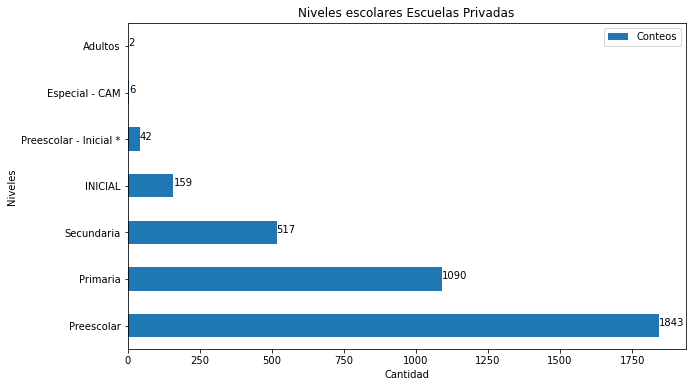

In [47]:
niveles.plot(kind="barh",figsize=(10,6))
for index, value in enumerate(niveles.Conteos):
    plt.text(value, index, str(value))
plt.title("Niveles escolares Escuelas Privadas")
plt.xlabel("Cantidad")
plt.ylabel("Niveles")
plt.savefig("Niveles escolares Privadas",bbox_inches='tight')
plt.show()

In [48]:
alcaldias = data.alcaldia.value_counts().rename_axis('Alcaldia').to_frame('Escuelas')
alcaldias

,Escuelas
Alcaldia,
IZTAPALAPA,627
GUSTAVO A. MADERO,470
TLALPAN,316
ALVARO OBREGON,315
BENITO JUAREZ,293
COYOACAN,290
MIGUEL HIDALGO,221
CUAUHTEMOC,188
CUAJIMALPA DE MORELOS,171


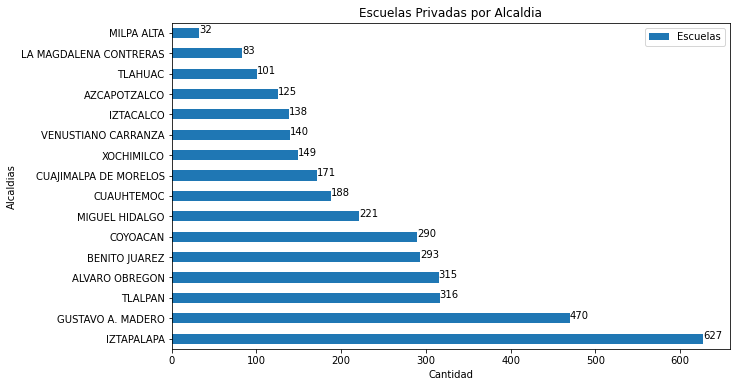

In [49]:
alcaldias.plot(kind="barh",figsize=(10,6))
for index, value in enumerate(alcaldias.Escuelas):
    plt.text(value,index, str(value))
plt.title("Escuelas Privadas por Alcaldia")
plt.xlabel("Cantidad")
plt.ylabel("Alcaldias")
plt.savefig("Escuelas por Alcaldia Privadas",bbox_inches='tight')
plt.show()

In [50]:
alcaldias.reset_index(inplace=True)
alcaldias.Alcaldia=alcaldias.Alcaldia.str.casefold()
alcaldias

,Alcaldia,Escuelas
0,iztapalapa,627
1,gustavo a. madero,470
2,tlalpan,316
3,alvaro obregon,315
4,benito juarez,293
5,coyoacan,290
6,miguel hidalgo,221
7,cuauhtemoc,188
8,cuajimalpa de morelos,171
9,xochimilco,149


In [51]:
inegi=pd.read_csv("Poblacion.csv")
inegi.head()

,Unnamed: 0,Alcaldia,Habitantes
0,0,Azcapotzalco,"432,205"
1,1,Coyoacán,"614,447"
2,2,Cuajimalpa de Morelos,"217,686"
3,3,Gustavo A. Madero,"1,173,351"
4,4,Iztacalco,"404,695"


In [52]:
# inegi.drop(columns=["Unnamed: 0"],inplace=True)
# inegi.plot(kind="barh",figsize=(10,6))

In [53]:
inegi.drop(columns=["Unnamed: 0"],inplace=True)
inegi.Alcaldia=inegi.Alcaldia.str.casefold()
inegi

,Alcaldia,Habitantes
0,azcapotzalco,"432,205"
1,coyoacán,"614,447"
2,cuajimalpa de morelos,"217,686"
3,gustavo a. madero,"1,173,351"
4,iztacalco,"404,695"
5,iztapalapa,"1,835,486"
6,la magdalena contreras,"247,622"
7,milpa alta,"152,685"
8,álvaro obregón,"759,137"
9,tláhuac,"392,313"


In [54]:
inegi.Alcaldia = inegi.Alcaldia.str.replace('á','a')
inegi.Alcaldia = inegi.Alcaldia.str.replace('é','e')
inegi.Alcaldia = inegi.Alcaldia.str.replace('ó','o')

In [55]:
escuelasypoblacion=(pd.merge(inegi, alcaldias, on='Alcaldia'))
escuelasypoblacion

,Alcaldia,Habitantes,Escuelas
0,azcapotzalco,"432,205",125
1,coyoacan,"614,447",290
2,cuajimalpa de morelos,"217,686",171
3,gustavo a. madero,"1,173,351",470
4,iztacalco,"404,695",138
5,iztapalapa,"1,835,486",627
6,la magdalena contreras,"247,622",83
7,milpa alta,"152,685",32
8,alvaro obregon,"759,137",315
9,tlahuac,"392,313",101


In [56]:
escuelasypoblacion.Habitantes = escuelasypoblacion.Habitantes.str.replace(',','')

In [57]:
escuelasypoblacion.Habitantes=escuelasypoblacion.Habitantes.astype(int)

In [58]:
escuelasypoblacion.sort_values("Habitantes",inplace=True)

In [59]:
escuelasypoblacion

,Alcaldia,Habitantes,Escuelas
7,milpa alta,152685,32
2,cuajimalpa de morelos,217686,171
6,la magdalena contreras,247622,83
9,tlahuac,392313,101
4,iztacalco,404695,138
14,miguel hidalgo,414470,221
0,azcapotzalco,432205,125
12,benito juarez,434153,293
11,xochimilco,442178,149
15,venustiano carranza,443704,140


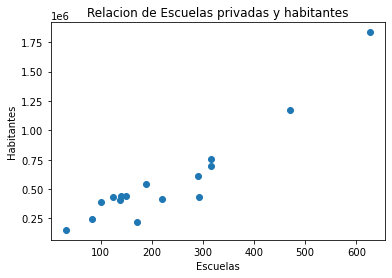

In [60]:
x=escuelasypoblacion.Escuelas
y=escuelasypoblacion.Habitantes
plt.title("Relacion de Escuelas privadas y habitantes")
plt.xlabel("Escuelas")
plt.ylabel("Habitantes")
plt.scatter(x,y)
plt.savefig("Escuelas Privadas relacion con habitantes",bbox_inches='tight')

In [61]:
escuelasypoblacion[["Escuelas","Habitantes"]].corr()

,Escuelas,Habitantes
Escuelas,1.00000,0.93825
Habitantes,0.93825,1.00000


In [62]:
Turno =data.turno.value_counts().rename_axis('Turno').to_frame('Escuelas')
Turno

,Escuelas
Turno,
MATUTINO,3531
TIEMPO COMPLETO,88
VESPERTINO,35
NOCTURNO,3
JORNADA AMPLIADA,2


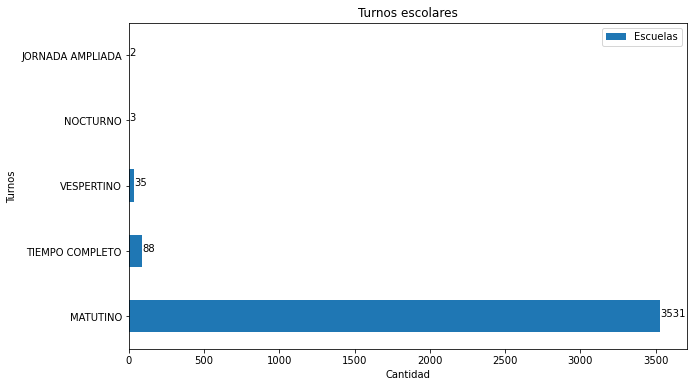

In [63]:
Turno.plot(kind="barh",figsize=(10,6))
for index, value in enumerate(Turno.Escuelas):
    plt.text(value, index, str(value))
plt.title("Turnos escolares")
plt.xlabel("Cantidad")
plt.ylabel("Turnos")
plt.savefig("Turnos escolares Privadas",bbox_inches='tight')
plt.show()

In [64]:
inegi

,Alcaldia,Habitantes
0,azcapotzalco,"432,205"
1,coyoacan,"614,447"
2,cuajimalpa de morelos,"217,686"
3,gustavo a. madero,"1,173,351"
4,iztacalco,"404,695"
5,iztapalapa,"1,835,486"
6,la magdalena contreras,"247,622"
7,milpa alta,"152,685"
8,alvaro obregon,"759,137"
9,tlahuac,"392,313"


In [65]:
inegi.Habitantes=inegi.Habitantes.str.replace(',','')

In [66]:
inegi.Habitantes=inegi.Habitantes.astype(int)

In [67]:
inegi=inegi.sort_values(by="Habitantes",ascending=False)

In [68]:
inegi

,Alcaldia,Habitantes
5,iztapalapa,1835486
3,gustavo a. madero,1173351
8,alvaro obregon,759137
10,tlalpan,699928
1,coyoacan,614447
13,cuauhtemoc,545884
15,venustiano carranza,443704
11,xochimilco,442178
12,benito juarez,434153
0,azcapotzalco,432205


<AxesSubplot:ylabel='Alcaldia'>

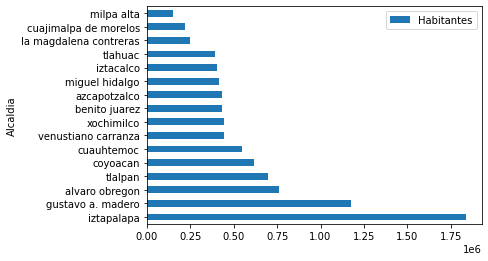

In [69]:
inegi.plot.barh(y="Habitantes",x="Alcaldia")

In [70]:
inegi=inegi.set_index(["Alcaldia"])

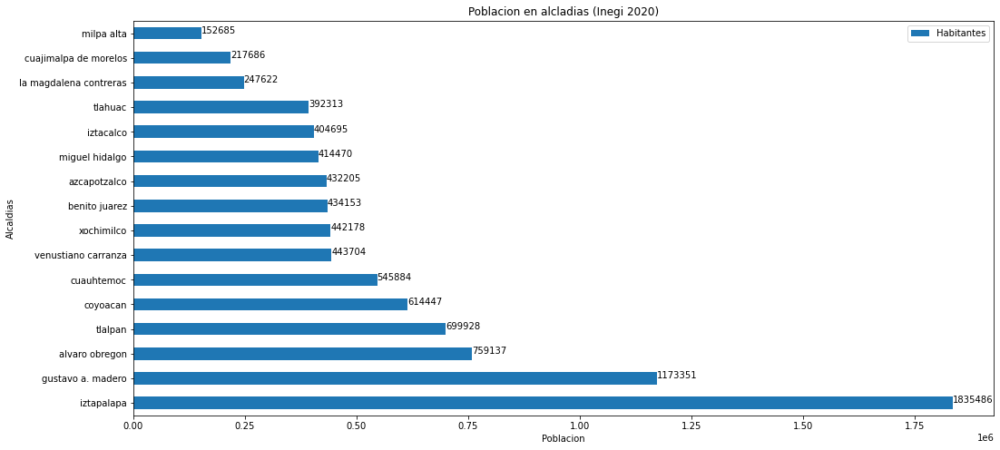

In [71]:
inegi.plot(kind="barh",figsize=(17,8))
for index, value in enumerate(inegi.Habitantes):
    plt.text(value, index, str(value))
plt.title("Poblacion en alcladias (Inegi 2020)")
plt.xlabel("Poblacion")
plt.ylabel("Alcaldias")
plt.savefig("Poblacion en Alcaldias.png",bbox_inches='tight')
plt.show()

In [61]:
inegi.to_excel("Poblacion.xlsx")
escuelasypoblacion.to_excel("escuelas y poblacion.xlsx")
data.to_excel("escuelas.xlsx")